# HoVer-Net Output Notebook

This repository enables the segmentation of nuclei in H&E whole-slide images (WSIs). For inference, we have incorporated two modes:

- Tile processing mode
- WSI processing mode

For tile processing, the input must be in a standard image format, such as `.jpg` or `.png`. <br />
For WSI processing, the input must be an [OpenSlide](https://openslide.org/) supported whole-slide image.

- Both tile and wsi processing modes output a `.json` file that contains:
        - bounding box coordinates for each nucleus
        - centroid coordinates for each nucleus
        - contour coordinates for each nucleus 
        - nucleus type predictions
        - per class probabilities for each nucleus (optional)
- tile mode also output a `.mat` and overlay file. The `.mat` file contains:
        - raw output of network (optional)
        - instance map containing values from 0 to N, where N is the number of nuclei
        - list of length N containing predictions for each nucleus
- wsi mode also produces a low resolution thumbnail and a tissue mask

In this notebook, we demonstrate how to utilise the output generated by these two different settings.

In [1]:
# load the libraries

import sys
sys.path.append('../')

import numpy as np
import os
import glob
import matplotlib.pyplot as plt
import scipy.io as sio
import cv2
import json
import openslide

from misc.wsi_handler import get_file_handler
from misc.viz_utils import visualize_instances_dict

import warnings
warnings.filterwarnings('ignore')

In [2]:
# first, we shall set the image tile, WSI and output paths.

tile_path = '../dataset/sample_tiles/imgs/'
tile_json_path = '../dataset/sample_tiles/pred/json/'
tile_mat_path = '../dataset/sample_tiles/pred/mat/'
tile_overlay_path = '../dataset/sample_tiles/pred/overlay/'
#wsi_path = '../dataset/sample_wsis/wsi/'
#wsi_json_path = '../dataset/sample_wsis/out/'

In [4]:
tile_path = '../kumar/test_same/Images/'
tile_json_path = '../output/json/'
tile_mat_path = '../output/mat/'
tile_overlay_path = '../output/overlay/'

In [5]:
tile_path = '../kumar/temp/'
tile_json_path = '../output/json/'
tile_mat_path = '../output/mat/'
tile_overlay_path = '../output/overlay/'

In [98]:
tile_path = '../stomach_input/'
tile_json_path = '../stomach_output/json/'
tile_mat_path = '../stomach_output/mat/'
tile_overlay_path = '../stomach_output/overlay/'

In [106]:
tile_path = '../stomach_input2/'
tile_json_path = '../stomach_output2/json/'
tile_mat_path = '../stomach_output2/mat/'
tile_overlay_path = '../stomach_output2/overlay/'

In [222]:
tile_path = '../stomach_input5000/'
tile_json_path = '../stomach_output5000/json/'
tile_mat_path = '../stomach_output5000/mat/'
tile_overlay_path = '../stomach_output5000/overlay/'

In [127]:
tile_path = '../svs_input_jpg/'
tile_json_path = '../svs_output_jpg/json/'
tile_mat_path = '../svs_output_jpg/mat/'
tile_overlay_path = '../svs_output_jpg/overlay/'

## Tile Processing Output

First let's view the 2D output from tile processing mode, that is stored in a `.mat` file.

# Tile  --  Seg ONLY

In [2]:
tile_path = '../svs_input_jpg/'
tile_json_path = '../svs_output_jpg/json/'
tile_mat_path = '../svs_output_jpg/mat/'
tile_overlay_path = '../svs_output_jpg/overlay/'


# load the original image, the `.mat` file and the overlay

image_list = glob.glob(tile_path + '*.tif')
image_list.sort()

# get a random image 
rand_nr = np.random.randint(0,len(image_list))


rand_nr = 0


image_file = image_list[rand_nr]

basename = os.path.basename(image_file)
image_ext = basename.split('.')[-1]
basename = basename[:-(len(image_ext)+1)]

image = cv2.imread(image_file)
# convert from BGR to RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# get the corresponding `.mat` file 
result_mat = sio.loadmat(tile_mat_path + basename + '.mat')

# get the overlay
overlay = cv2.imread(tile_overlay_path + basename + '.png')
overlay = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

ValueError: low >= high

In [227]:
# ** now, let's get the outputs and print some basic shape information
# 2D map where each nucleus has a unique ID assigned. 0 is background
inst_map = result_mat['inst_map'] 
# Nx2 length array denoting nuclear type predictions. N is the number of nuclei
# idx=0 denotes the corresponding inst_id in the `inst_map` and 
# idx=1 denotes the type of that inst_id

#inst_type = result_mat['inst_type'] 

print('instance map shape', inst_map.shape)
# double check the number of instances is the same as the number of type predictions
print('number of instances', len(np.unique(inst_map)[1:].tolist()))

#print('number of type predictions', len(np.unique(inst_type[:,1])))

print('overlay shape', overlay.shape)

instance map shape (5000, 5000)
number of instances 14730
overlay shape (5000, 5000, 3)


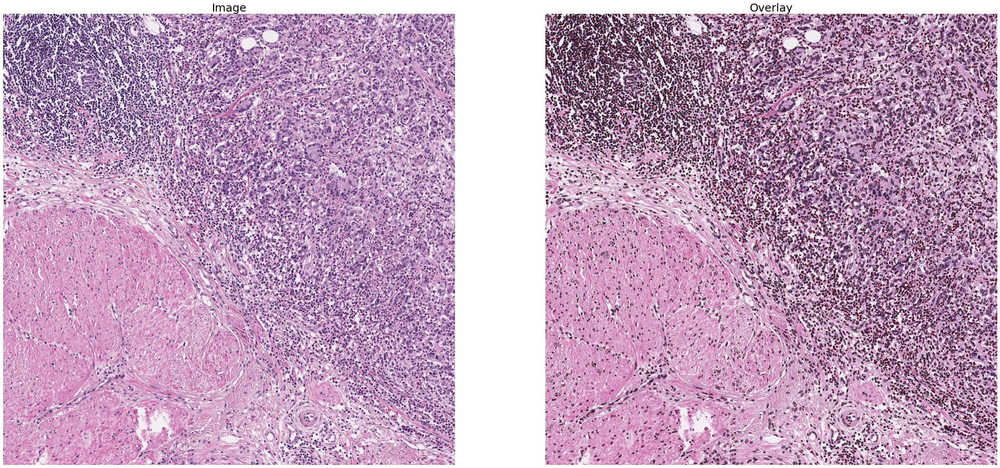

In [228]:
# plot the original image, along with the instance map and the overlay

plt.figure(figsize=(40,20))

plt.subplot(1,2,1)
plt.imshow(image)
plt.axis('off')
plt.title('Image', fontsize=25)

#plt.subplot(1,3,2)
#plt.imshow(inst_map)
#plt.axis('off')
#plt.title('Instance Map', fontsize=25)

plt.subplot(1,2,2)
plt.imshow(overlay)
plt.axis('off')
plt
plt.title('Overlay', fontsize=25)

plt.show()

In [178]:
# load the json file and add the contents to corresponding lists

json_path = tile_json_path + basename + '.json'

bbox_list = []
centroid_list = []
contour_list = [] 
type_list = []

with open(json_path) as json_file:
    data = json.load(json_file)
    mag_info = data['mag']
    nuc_info = data['nuc']
    for inst in nuc_info:
        inst_info = nuc_info[inst]
        inst_centroid = inst_info['centroid']
        centroid_list.append(inst_centroid)
        inst_contour = inst_info['contour']
        contour_list.append(inst_contour)
        inst_bbox = inst_info['bbox']
        bbox_list.append(inst_bbox)
        inst_type = inst_info['type']
        type_list.append(inst_type)

In [179]:
# get the number of items in each list

print('Number of centroids', len(centroid_list))
print('Number of contours', len(contour_list))
print('Number of bounding boxes', len(bbox_list))

# each item is a list of coordinates - let's take a look!
print('-'*60)
print(centroid_list[0])
print('-'*60)
print(contour_list[0])
print('-'*60)
print(bbox_list[0])

Number of centroids 700
Number of contours 700
Number of bounding boxes 700
------------------------------------------------------------
[81.76086956521739, 1.565217391304348]
------------------------------------------------------------
[[76, 0], [76, 1], [77, 2], [78, 2], [79, 3], [80, 3], [81, 4], [84, 4], [85, 3], [86, 3], [86, 2], [87, 1], [87, 0]]
------------------------------------------------------------
[[0, 76], [5, 88]]


Now, let's view the contents of the `.json` file.

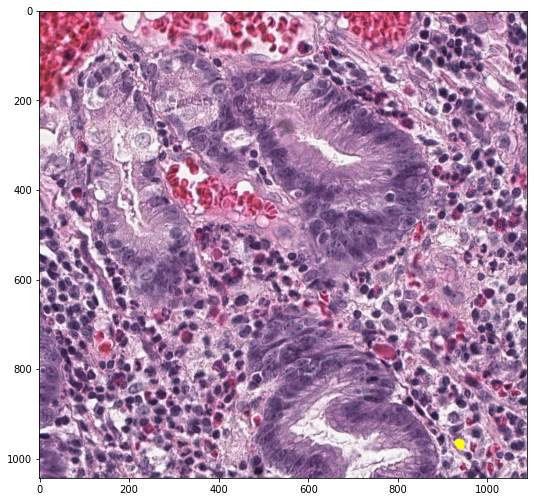

In [180]:
# get a single contour, bounding box and centroid and visualise

rand_nucleus = np.random.randint(0, len(centroid_list))
rand_centroid = centroid_list[rand_nucleus]
rand_bbox = bbox_list[rand_nucleus]
rand_contour = contour_list[rand_nucleus]

# draw the overlays
overlay = image.copy()
overlay = cv2.drawContours(overlay.astype('uint8'), [np.array(rand_contour)], -1, (255, 255, 0), 10)
#overlay = cv2.circle(overlay.astype('uint8'),(np.round(rand_centroid[0]).astype('int'), np.round(rand_centroid[1]).astype('int')), 10, (0,255,0), -1)
#overlay = cv2.rectangle(overlay.astype('uint8'), (rand_bbox[0][1], rand_bbox[0][0]), (rand_bbox[1][1], rand_bbox[1][0]), (255,0,0), 1)
plt.imshow(overlay, cmap='gray')
plt.tight_layout(-10)
plt.show()

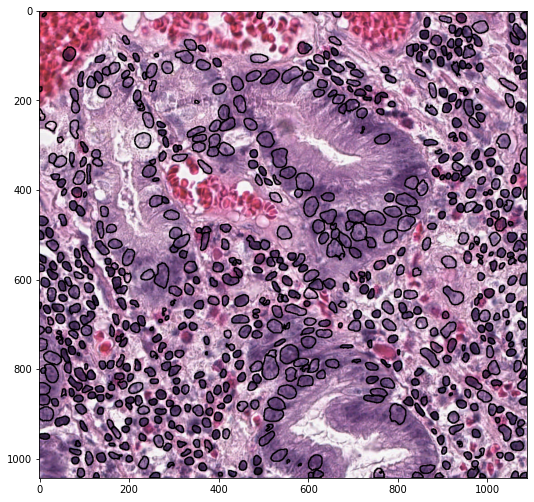

In [181]:
overlay = image.copy()
for i in range(len(contour_list)):
    
    contour = contour_list[i]
    
    overlay = cv2.drawContours(overlay.astype('uint8'), [np.array(contour)], -1, (0, 0, 0), 2)
    
plt.imshow(overlay, cmap='gray')
plt.tight_layout(-10)
plt.show()

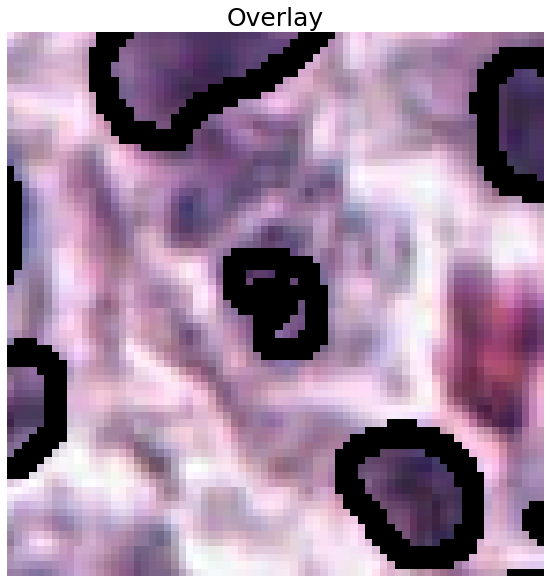

In [182]:
# plot the cropped overlay

pad = 30
crop1 = rand_bbox[0][0]-pad
if crop1 < 0: 
    crop1 = 0
crop2 = rand_bbox[1][0]+pad
if crop2 > overlay.shape[0]: 
    crop2 = overlay.shape[0]
crop3 = rand_bbox[0][1]-pad
if crop3 < 0: 
    crop3 = 0
crop4 = rand_bbox[1][1]+pad
if crop4 > overlay.shape[1]: 
    crop4 = overlay.shape[1]
crop_overlay = overlay[crop1:crop2,crop3:crop4,:]
plt.figure(figsize=(10,10))

plt.imshow(crop_overlay)
plt.axis('off')
plt.title('Overlay', fontsize=25)
plt.show()

# Tile  --  Seg + Classifier

In [193]:
tile_path = '../svs_input_jpg/'
tile_json_path = '../svs_output_jpg/json/'
tile_mat_path = '../svs_output_jpg/mat/'
tile_overlay_path = '../svs_output_jpg/overlay/'

In [194]:
# load the original image, the `.mat` file and the overlay

image_list = glob.glob(tile_path + '*.jpg')
image_list.sort()

# get a random image 
rand_nr = np.random.randint(0,len(image_list))
rand_nr = 0
image_file = image_list[rand_nr]


image = cv2.imread(image_file)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

In [195]:
# load the json file (may take ~20 secs)

json_path_wsi = '../svs_output_jpg_type/json/' + 'svs_jpg.json'

bbox_list_wsi = []
centroid_list_wsi = []
contour_list_wsi = [] 
type_list_wsi = []

# add results to individual lists
with open(json_path_wsi) as json_file:
    data = json.load(json_file)
    mag_info = data['mag']
    nuc_info = data['nuc']
    for inst in nuc_info:
        inst_info = nuc_info[inst]
        inst_centroid = inst_info['centroid']
        centroid_list_wsi.append(inst_centroid)
        inst_contour = inst_info['contour']
        contour_list_wsi.append(inst_contour)
        inst_bbox = inst_info['bbox']
        bbox_list_wsi.append(inst_bbox)
        inst_type = inst_info['type']
        type_list_wsi.append(inst_type)

In [196]:
tile_info_dict = {}
count = 0
for idx, cnt in enumerate(contour_list_wsi):
    cnt_tmp = np.array(cnt)
    cnt_tmp = cnt_tmp[(cnt_tmp[:,0] >= coords_xmin) & (cnt_tmp[:,0] <= coords_xmax) & (cnt_tmp[:,1] >= coords_ymin) & (cnt_tmp[:,1] <= coords_ymax)] 
    label = str(type_list_wsi[idx])
    if cnt_tmp.shape[0] > 0:
        cnt_adj = np.round(cnt_tmp - np.array([x_tile,y_tile])).astype('int')
        tile_info_dict[idx] = {'contour': cnt_adj, 'type':label}
        count += 1
        
        
# plot the overlay

# the below dictionary is specific to PanNuke checkpoint - will need to modify depeending on categories used
type_info = {
    "0" : ["nolabe", [0  ,   0,   0]], 
    "1" : ["neopla", [255,   0,   0]], 
    "2" : ["inflam", [0  , 255,   0]], 
    "3" : ["connec", [0  ,   0, 255]], 
    "4" : ["necros", [255, 255,   0]], 
    "5" : ["no-neo", [255, 165,   0]] 
}

plt.figure(figsize=(18,15))
overlaid_output = visualize_instances_dict(image, tile_info_dict, type_colour=type_info)
plt.imshow(overlaid_output)
plt.axis('off')
plt.title('Segmentation Overlay')
plt.show()

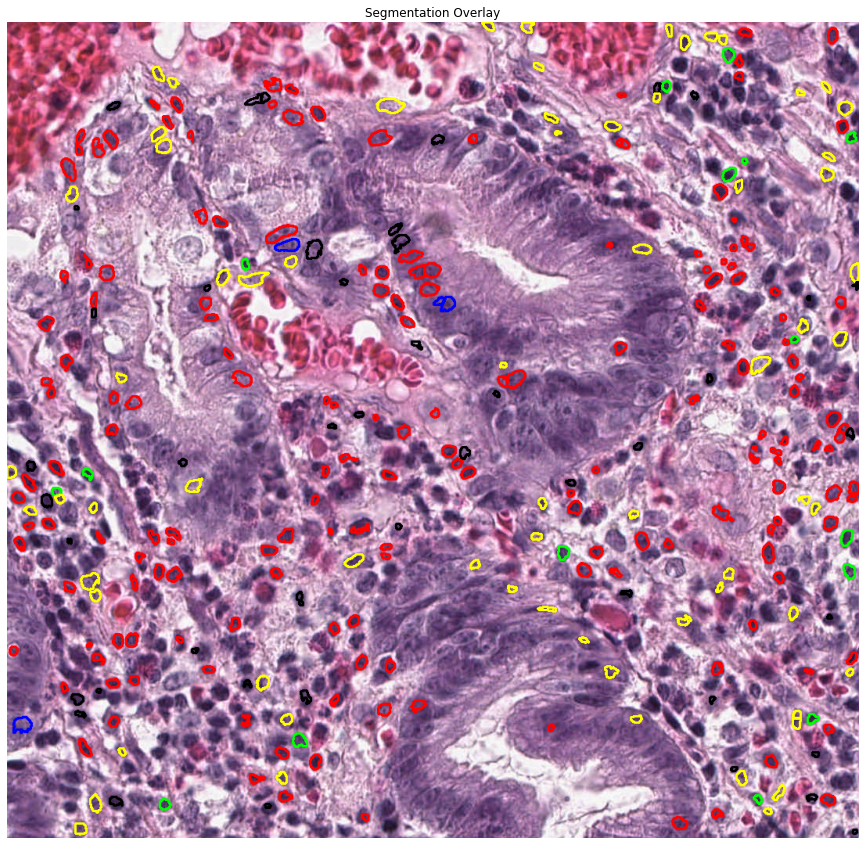

In [197]:
# plot the overlay

# the below dictionary is specific to PanNuke checkpoint - will need to modify depeending on categories used
type_info = {
    "0" : ["nolabe", [0  ,   0,   0]], 
    "1" : ["neopla", [255,   0,   0]], 
    "2" : ["inflam", [0  , 255,   0]], 
    "3" : ["connec", [0  ,   0, 255]], 
    "4" : ["necros", [255, 255,   0]], 
    "5" : ["no-neo", [255, 165,   0]] 
}

plt.figure(figsize=(18,15))
overlaid_output = visualize_instances_dict(image, tile_info_dict, type_colour=type_info)
plt.imshow(overlaid_output)
plt.axis('off')
plt.title('Segmentation Overlay')
plt.show()

## WSI Processing Output

For WSI processing, our output is in json format and therefore we can apply a similar technique to what we saw above to extract the instance information. As well as the segmentation result, a low resolution thumbnail and mask is saved.

Below we will :
- Display the thumbnail and mask
- Show how to get a tile from a processed WSI and display the corresponding overlay.

# WSI -- Only Seg

In [6]:
wsi_path = '../svs_input/'
wsi_json_path = '../svs_output_svs/'

# get the list of all wsis
wsi_list = glob.glob(wsi_path + '*')

# get a random wsi from the list
rand_wsi = np.random.randint(0,len(wsi_list))
wsi_file = wsi_list[rand_wsi]
wsi_ext = '.svs'

wsi_basename = os.path.basename(wsi_file)
wsi_basename = wsi_basename[:-(len(wsi_ext))]

In [7]:
temp = openslide.OpenSlide(wsi_list[0])
temp.dimensions

image = temp.read_region((0, 0), 0, (temp.dimensions[0], temp.dimensions[1]))
image = np.array(image)[:, :, :3]

In [8]:
# load the json file (may take ~20 secs)

json_path_wsi = wsi_json_path + 'json/' + wsi_basename + '.json'

bbox_list_wsi = []
centroid_list_wsi = []
contour_list_wsi = [] 
type_list_wsi = []

# add results to individual lists
with open(json_path_wsi) as json_file:
    data = json.load(json_file)
    mag_info = data['mag']
    nuc_info = data['nuc']
    for inst in nuc_info:
        inst_info = nuc_info[inst]
        inst_centroid = inst_info['centroid']
        centroid_list_wsi.append(inst_centroid)
        inst_contour = inst_info['contour']
        contour_list_wsi.append(inst_contour)
        inst_bbox = inst_info['bbox']
        bbox_list_wsi.append(inst_bbox)
        inst_type = inst_info['type']
        type_list_wsi.append(inst_type)

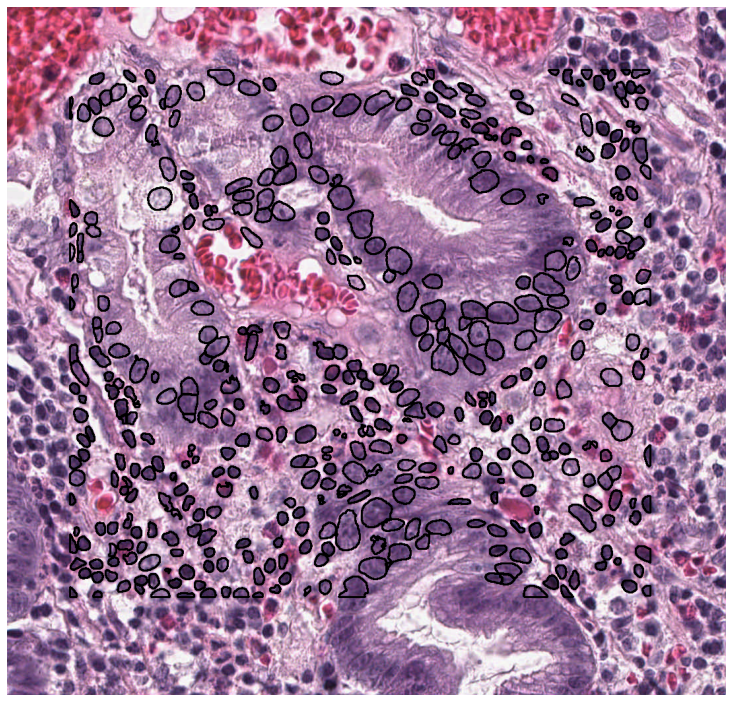

In [9]:
overlay = image.copy()
for i in range(len(centroid_list_wsi)):
    
    contour_coord = contour_list_wsi[i]
    
    overlay = cv2.drawContours(overlay.astype('uint8'), [np.array(contour_coord)], -1, (0, 0, 0), 2)
    
plt.imshow(overlay)
plt.axis('off')
plt.tight_layout(-20)

In [10]:
print('Number of centroids', len(contour_list_wsi))
print('Number of contours', len(contour_list_wsi))
print('Number of bounding boxes', len(contour_list_wsi))

Number of centroids 451
Number of contours 451
Number of bounding boxes 451


# WSI -- Seg + Classifier

In [198]:
wsi_path = '../svs_input/'
wsi_json_path = '../svs_output_type/'

In [199]:
# get the list of all wsis
wsi_list = glob.glob(wsi_path + '*')

# get a random wsi from the list
rand_wsi = np.random.randint(0,len(wsi_list))
wsi_file = wsi_list[rand_wsi]
wsi_ext = '.svs'

wsi_basename = os.path.basename(wsi_file)
wsi_basename = wsi_basename[:-(len(wsi_ext))]

In [200]:
temp = openslide.OpenSlide(wsi_list[0])
temp.dimensions

image = temp.read_region((0, 0), 0, (temp.dimensions[0], temp.dimensions[1]))
image = np.array(image)[:, :, :3]

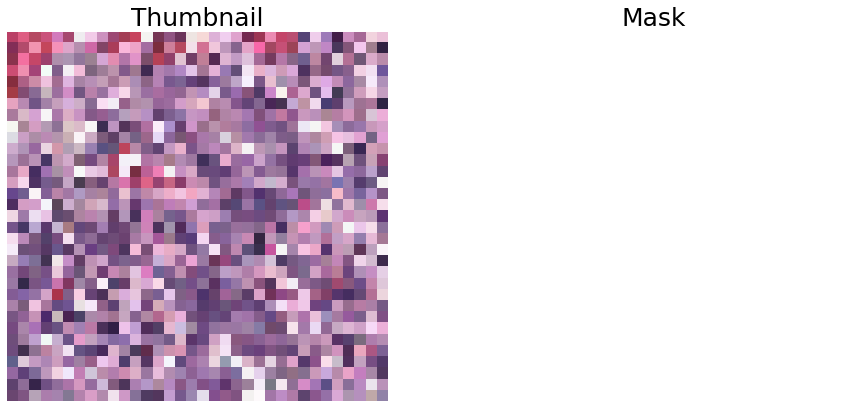

In [202]:
# read the thumbnail and mask from file

mask_path_wsi = wsi_json_path + 'mask/' + wsi_basename + '.png'
thumb_path_wsi = wsi_json_path + 'thumb/' + wsi_basename + '.png'

thumb = cv2.cvtColor(cv2.imread(thumb_path_wsi), cv2.COLOR_BGR2RGB)
mask = cv2.cvtColor(cv2.imread(mask_path_wsi), cv2.COLOR_BGR2RGB)

# plot the low resolution thumbnail along with the tissue mask

plt.figure(figsize=(15,8))

plt.subplot(1,2,1)
plt.imshow(thumb)
plt.axis('off')
plt.title('Thumbnail', fontsize=25)

plt.subplot(1,2,2)
plt.imshow(mask)
plt.axis('off')
plt.title('Mask', fontsize=25)

plt.show()

In [11]:
# load the json file (may take ~20 secs)

json_path_wsi = wsi_json_path + 'json/' + wsi_basename + '.json'

bbox_list_wsi = []
centroid_list_wsi = []
contour_list_wsi = [] 
type_list_wsi = []

# add results to individual lists
with open(json_path_wsi) as json_file:
    data = json.load(json_file)
    mag_info = data['mag']
    nuc_info = data['nuc']
    for inst in nuc_info:
        inst_info = nuc_info[inst]
        inst_centroid = inst_info['centroid']
        centroid_list_wsi.append(inst_centroid)
        inst_contour = inst_info['contour']
        contour_list_wsi.append(inst_contour)
        inst_bbox = inst_info['bbox']
        bbox_list_wsi.append(inst_bbox)
        inst_type = inst_info['type']
        type_list_wsi.append(inst_type)

In [209]:
# let's generate a tile from the WSI

# define the region to select
x_tile = 0
y_tile = 0
w_tile = temp.dimensions[0]
h_tile = temp.dimensions[1]
# load the wsi object and read region
wsi_obj = get_file_handler(wsi_file, wsi_ext)
wsi_obj.prepare_reading(read_mag=mag_info)
wsi_tile = wsi_obj.read_region((x_tile,y_tile), (w_tile,h_tile))

# only consider results that are within the tile

coords_xmin = x_tile
coords_xmax = x_tile + w_tile
coords_ymin = y_tile
coords_ymax = y_tile + h_tile

tile_info_dict = {}
count = 0
for idx, cnt in enumerate(contour_list_wsi):
    cnt_tmp = np.array(cnt)
    cnt_tmp = cnt_tmp[(cnt_tmp[:,0] >= coords_xmin) & (cnt_tmp[:,0] <= coords_xmax) & (cnt_tmp[:,1] >= coords_ymin) & (cnt_tmp[:,1] <= coords_ymax)] 
    label = str(type_list_wsi[idx])
    if cnt_tmp.shape[0] > 0:
        cnt_adj = np.round(cnt_tmp - np.array([x_tile,y_tile])).astype('int')
        tile_info_dict[idx] = {'contour': cnt_adj, 'type':label}
        count += 1
        
        
# plot the overlay

# the below dictionary is specific to PanNuke checkpoint - will need to modify depeending on categories used
type_info = {
    "0" : ["nolabe", [0  ,   0,   0]], 
    "1" : ["neopla", [255,   0,   0]], 
    "2" : ["inflam", [0  , 255,   0]], 
    "3" : ["connec", [0  ,   0, 255]], 
    "4" : ["necros", [255, 255,   0]], 
    "5" : ["no-neo", [255, 165,   0]] 
}

plt.figure(figsize=(18,15))
overlaid_output = visualize_instances_dict(wsi_tile, tile_info_dict, type_colour=type_info)

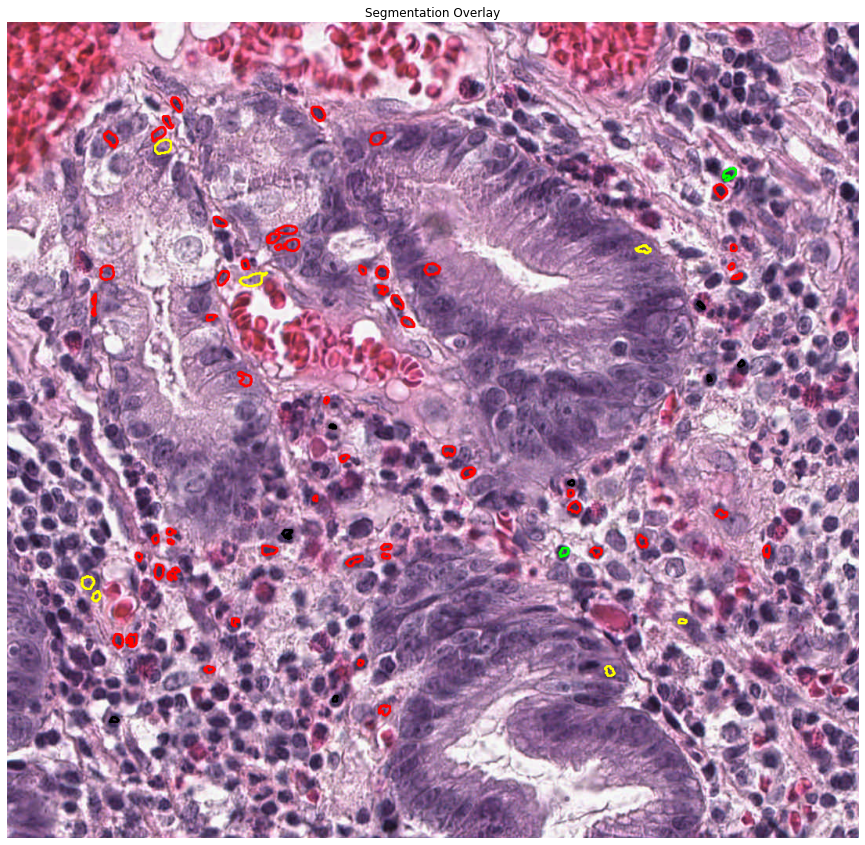

In [211]:
# plot the overlay

# the below dictionary is specific to PanNuke checkpoint - will need to modify depeending on categories used
type_info = {
    "0" : ["nolabe", [0  ,   0,   0]], 
    "1" : ["neopla", [255,   0,   0]], 
    "2" : ["inflam", [0  , 255,   0]], 
    "3" : ["connec", [0  ,   0, 255]], 
    "4" : ["necros", [255, 255,   0]], 
    "5" : ["no-neo", [255, 165,   0]] 
}

plt.figure(figsize=(18,15))
overlaid_output = visualize_instances_dict(wsi_tile, tile_info_dict, type_colour=type_info)
plt.imshow(overlaid_output)
plt.axis('off')
plt.title('Segmentation Overlay')
plt.show()